# Analyze ParaRel causal tracing results (top10)

In [1]:
import json
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import os
import math
import scipy
import random

from experiments.causal_trace import plot_trace_heatmap, plot_trace_heatmap_from_values, plot_normalized_trace_heatmap_from_values

In [2]:
query_file = "/cephyr/users/lovhag/Alvis/projects/rome/data/P19_gpt2_xl_preds.jsonl"

## Load the queries

In [3]:
queries = pd.DataFrame()
with open(query_file) as f:
    for line in f:
        queries = queries.append(json.loads(line), ignore_index=True)
        
queries.head()

,attribute,candidate_p,candidate_prediction,candidate_rank,gold_p,gold_rank,known_id,prediction,prediction_p,prompt,relation_id,subject,template,top10_tokens,top10_tokens_probs
0,Alexandra,0.024580,London,2.0,0.000011,3197.0,0.0,New,0.038592,Allan Peiper was born in,P19,Allan Peiper,{} was born in,"[ New, the, London, 18, Toronto, Montreal...","[0.03859247639775276, 0.03803418204188347, 0.0..."
1,Alexandra,0.029013,Canada,2.0,0.000011,3354.0,1.0,the,0.077758,Allan Peiper is originally from,P19,Allan Peiper,{} is originally from,"[ New, the, London, 18, Toronto, Montreal...","[0.04142675921320915, 0.07775774598121643, 0.0..."
2,Alexandra,0.023173,Canada,2.0,0.000013,3389.0,2.0,the,0.079163,Allan Peiper was originally from,P19,Allan Peiper,{} was originally from,"[ New, the, London, 18, Toronto, Montreal...","[0.03634488210082054, 0.07916285842657089, 0.0..."
3,Alexandra,0.035623,Canada,2.0,0.000005,4780.0,3.0,the,0.154659,Allan Peiper is native to,P19,Allan Peiper,{} is native to,"[ New, the, London, 18, Toronto, Montreal...","[0.03823259472846985, 0.15465885400772095, 0.0..."
4,Alexandra,0.032304,Canada,1.0,0.000007,4640.0,4.0,the,0.132673,Allan Peiper was native to,P19,Allan Peiper,{} was native to,"[ New, the, London, 18, Toronto, Montreal...","[0.029023099690675735, 0.13267268240451813, 0...."


## Analyze the causal tracing results

- Do we observe the same patterns for impactful MLP states to restore for the same output token across paraphrases (even though this token might not be the top prediction)?
- Analyze the patterns across the top 10 tokens from when using the original LAMA prompts.

- Currently, the causal tracing results only cover about 200 subjects out of 779. We might want to expand this analysis once the evaluations are in place!

In [4]:
results_folder = "/cephyr/users/lovhag/Alvis/projects/rome/data/results/gpt2-xl/P19/causal_trace_pararel_1711765"

### Plot impact patterns for the same output tokens across paraphrases

Plotting results for subject Allan Peiper...


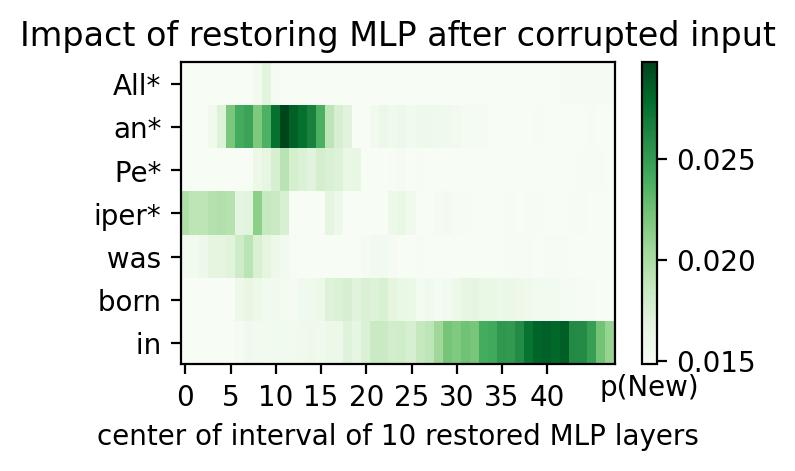

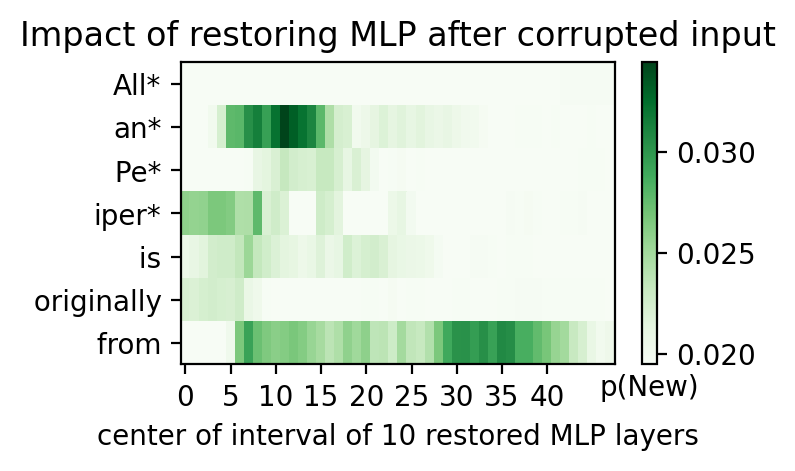

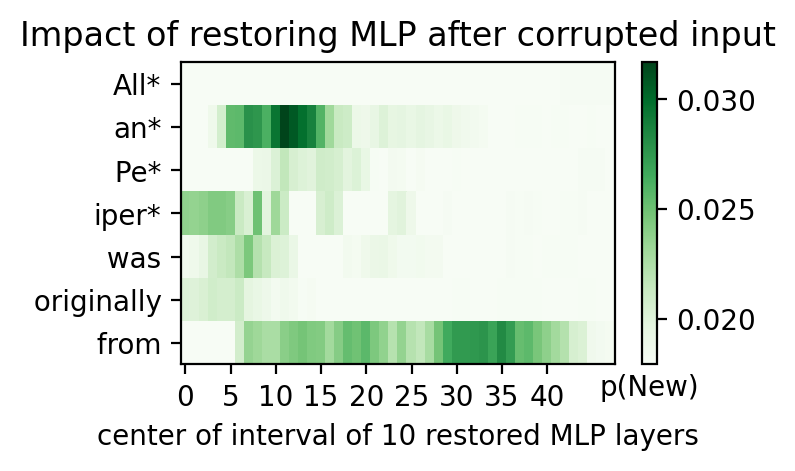

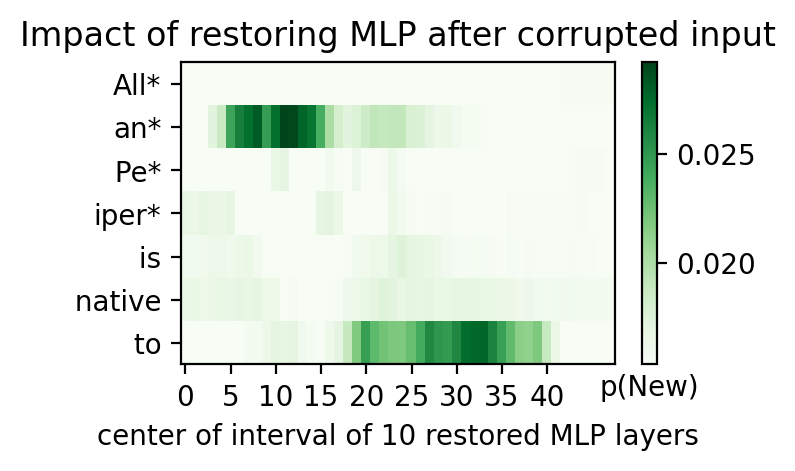

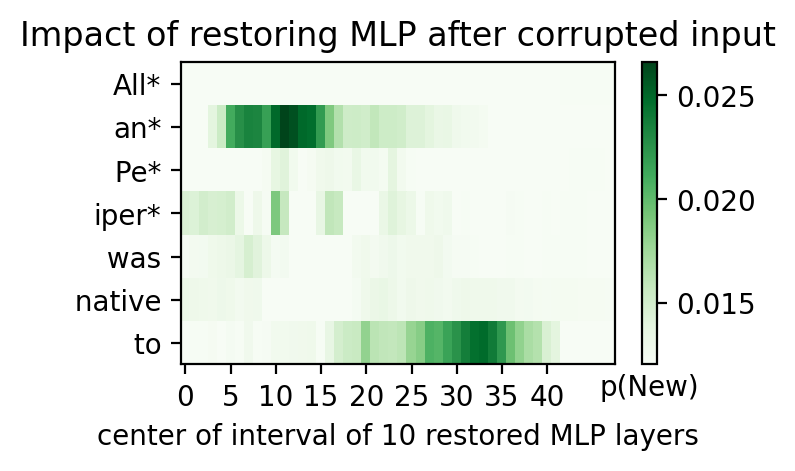

...

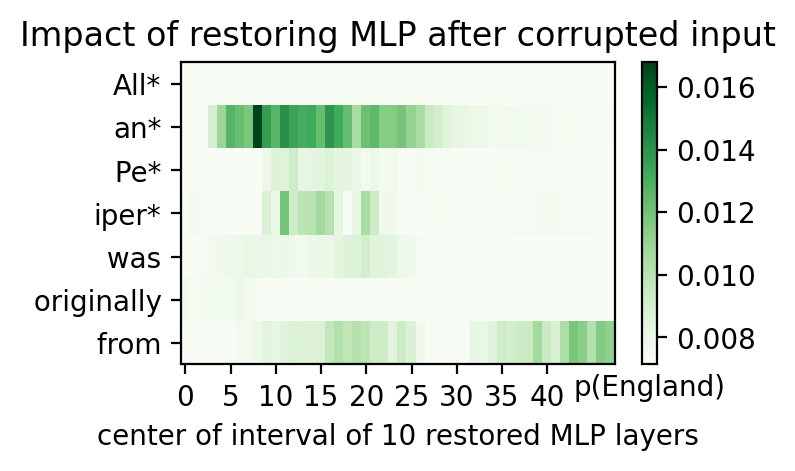

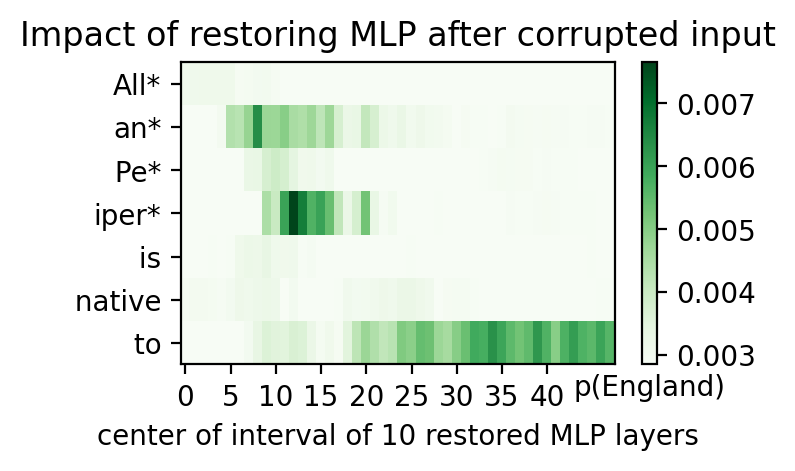

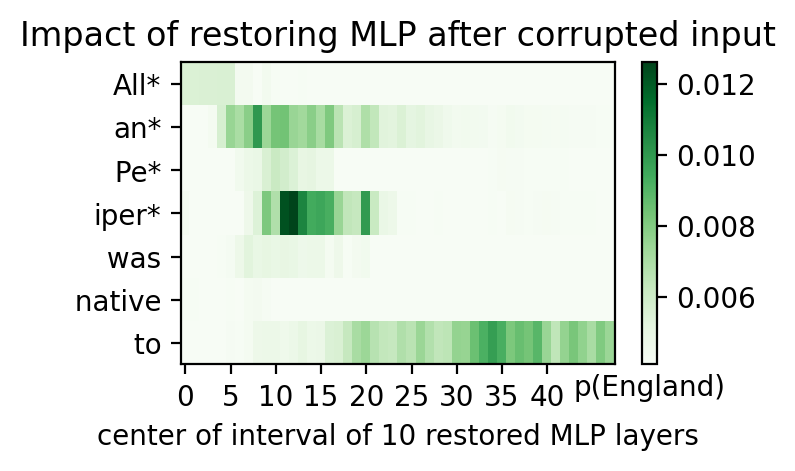

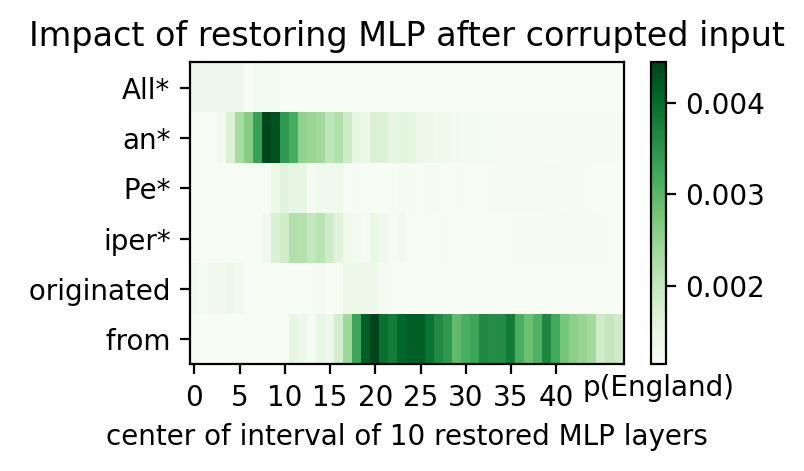

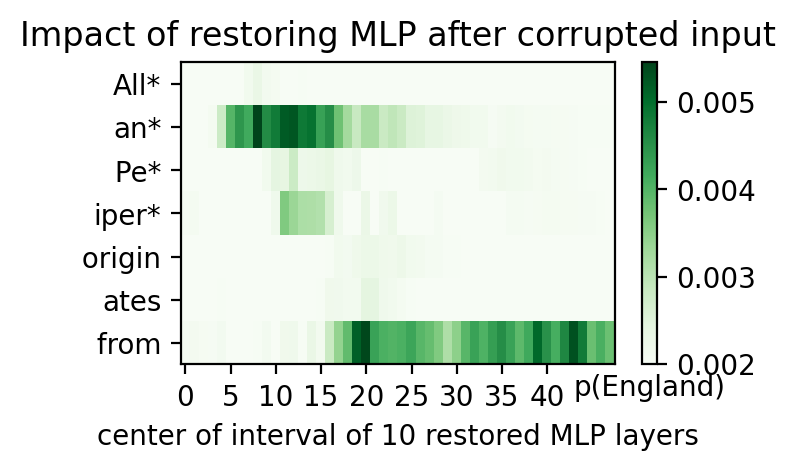

Plotting results for subject Paul Mounsey...


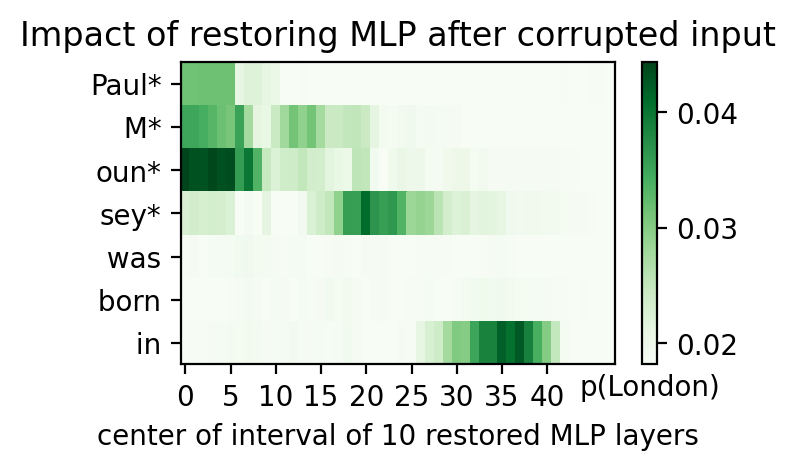

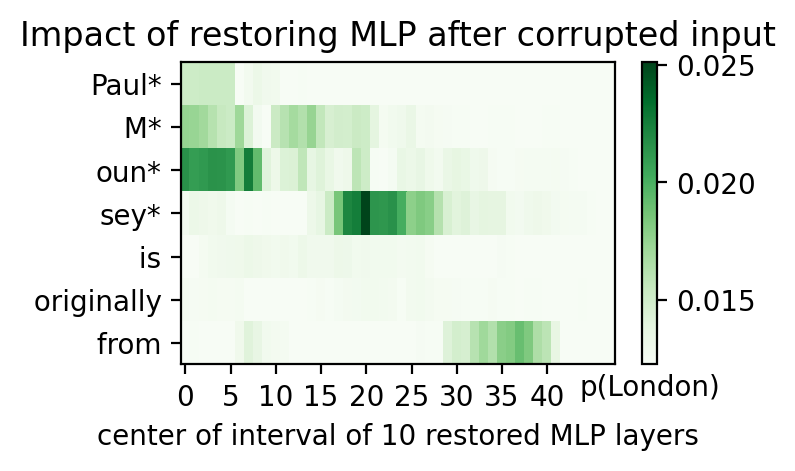

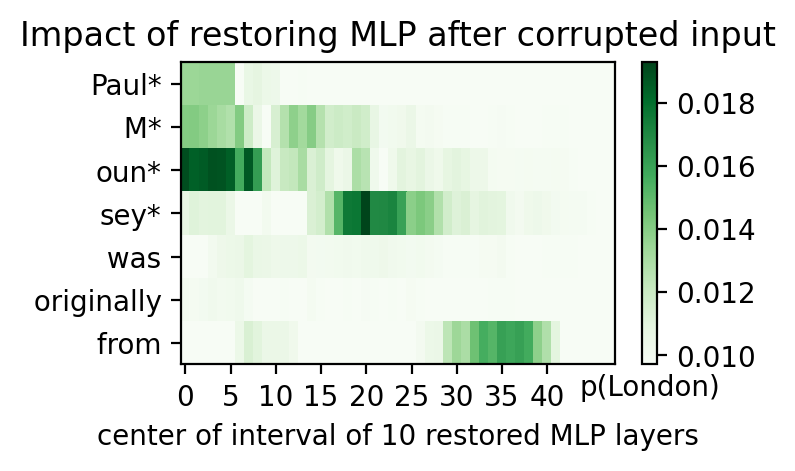

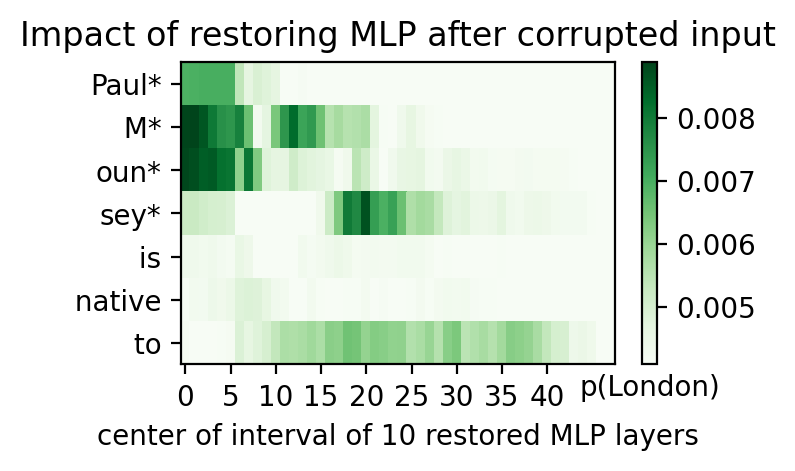

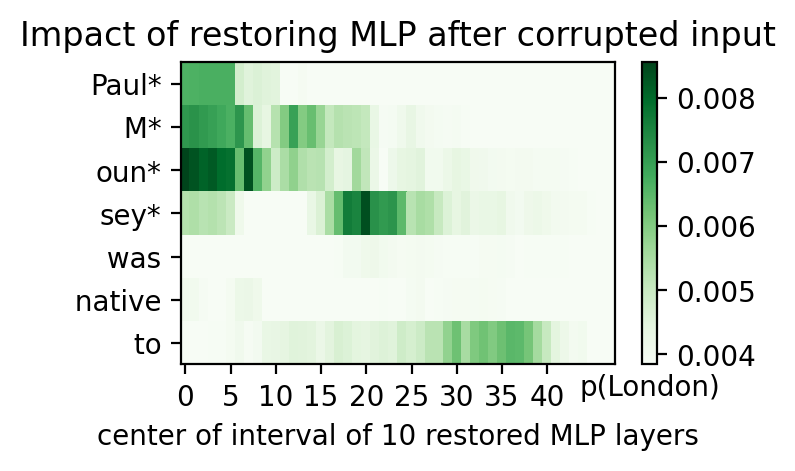

...

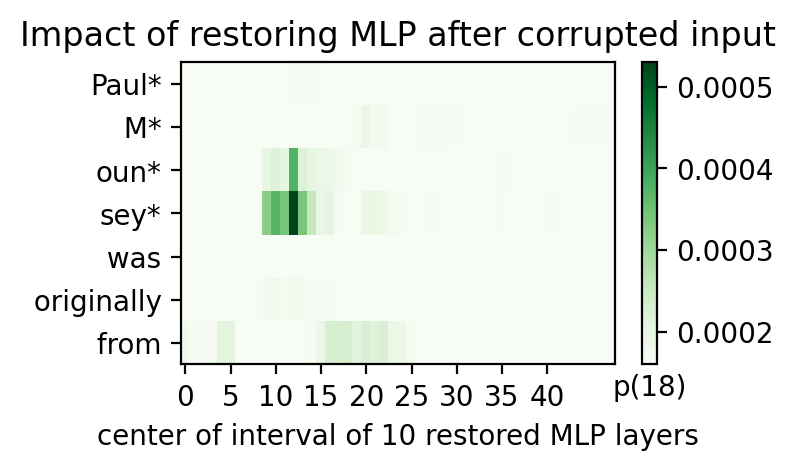

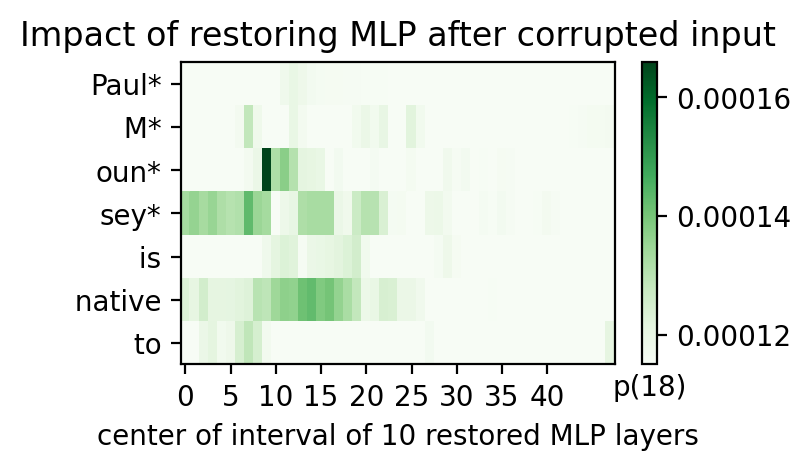

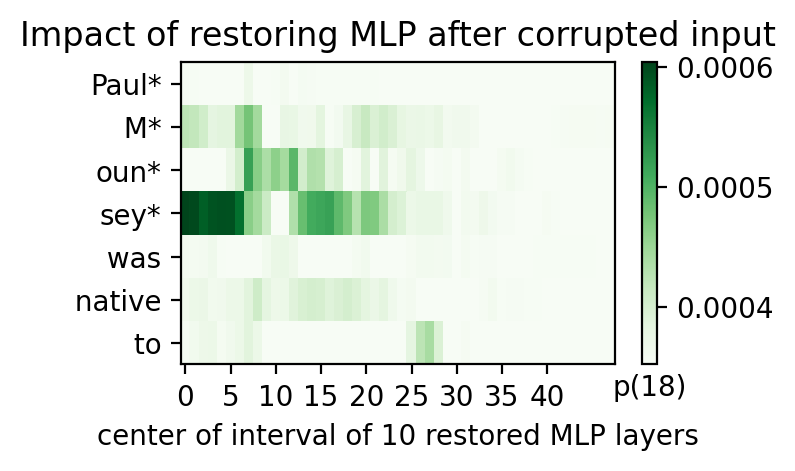

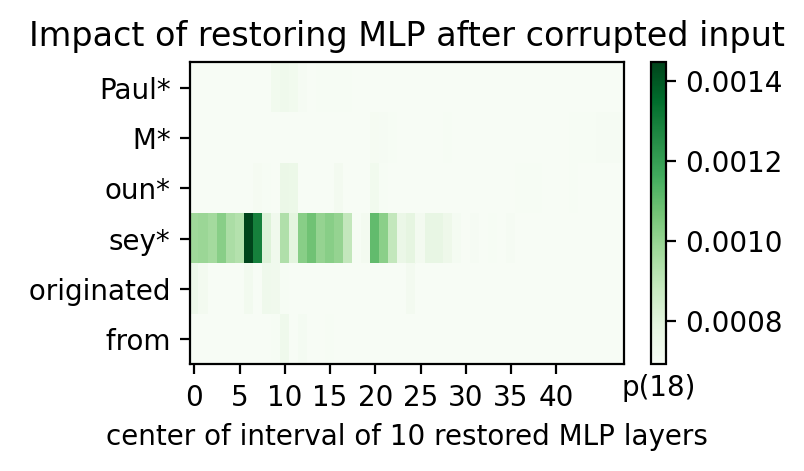

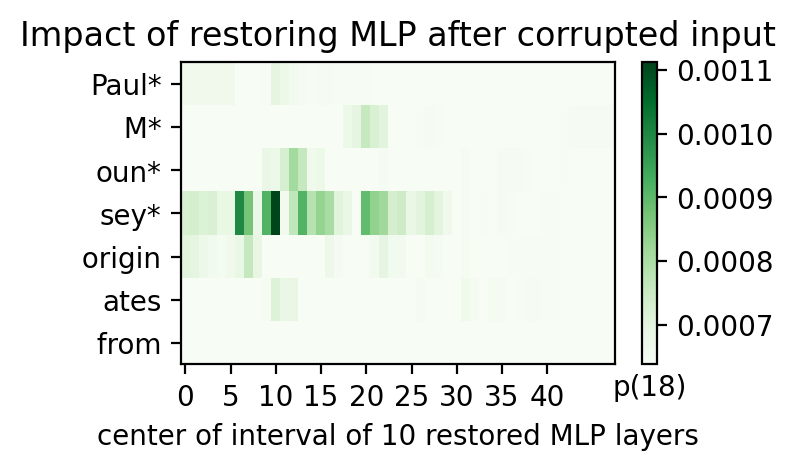

Plotting results for subject Moe Koffman...


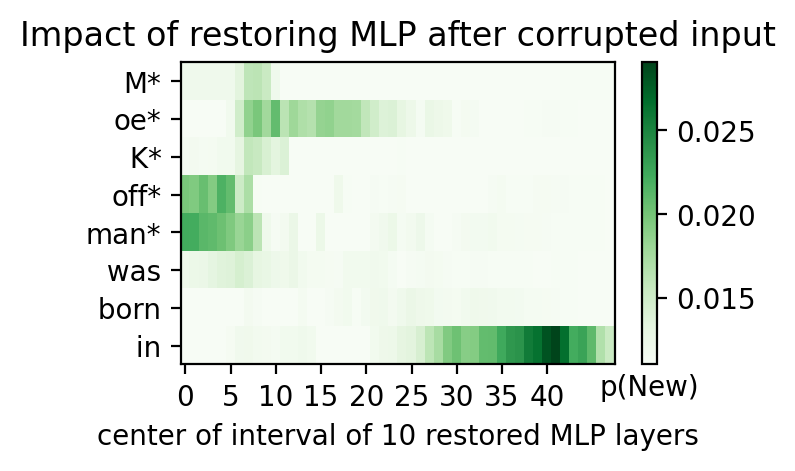

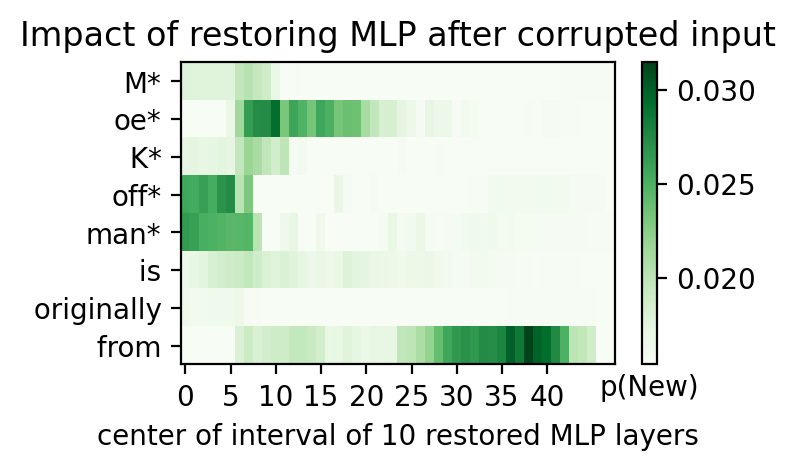

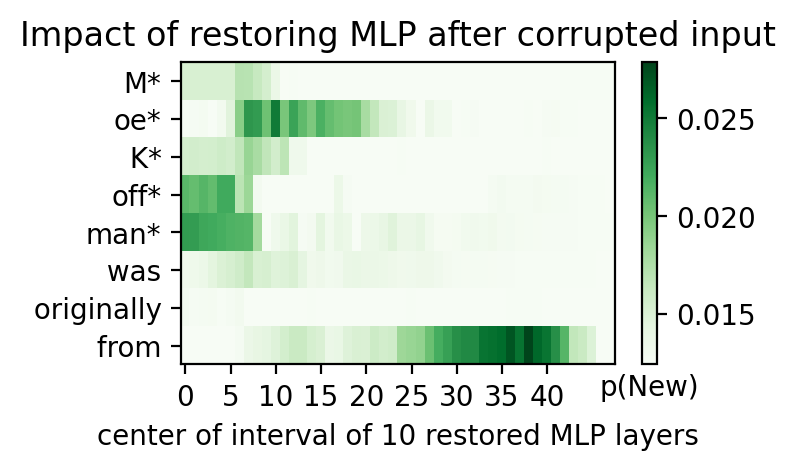

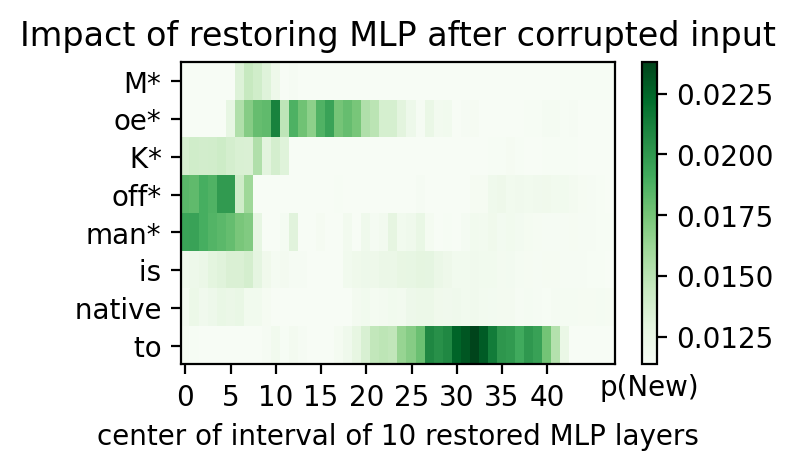

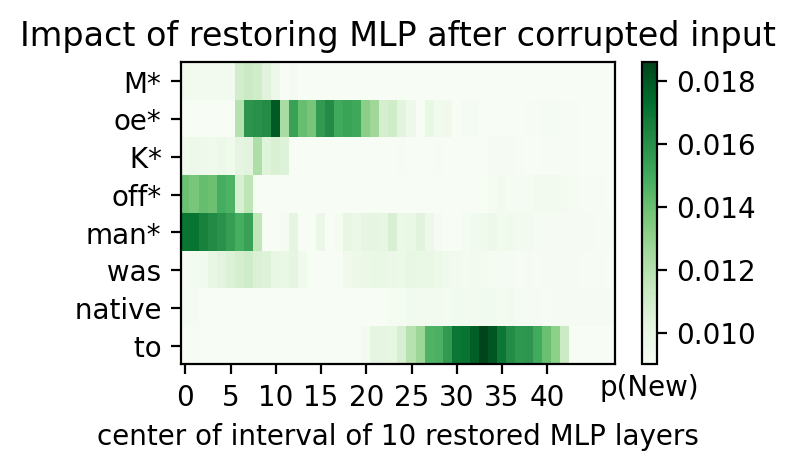

...

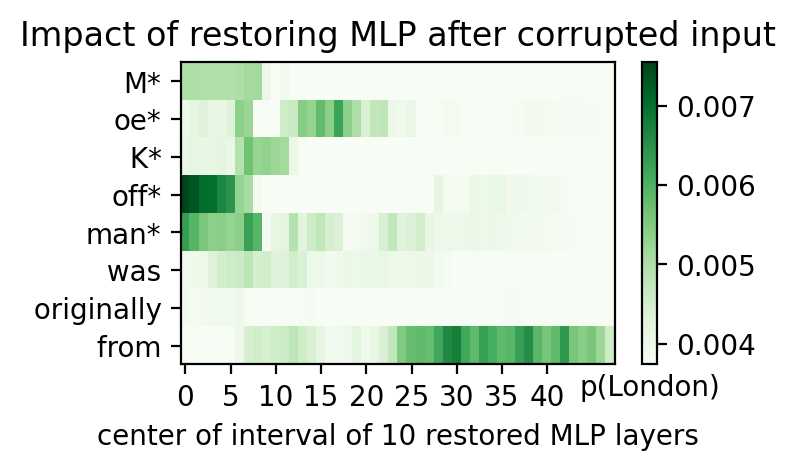

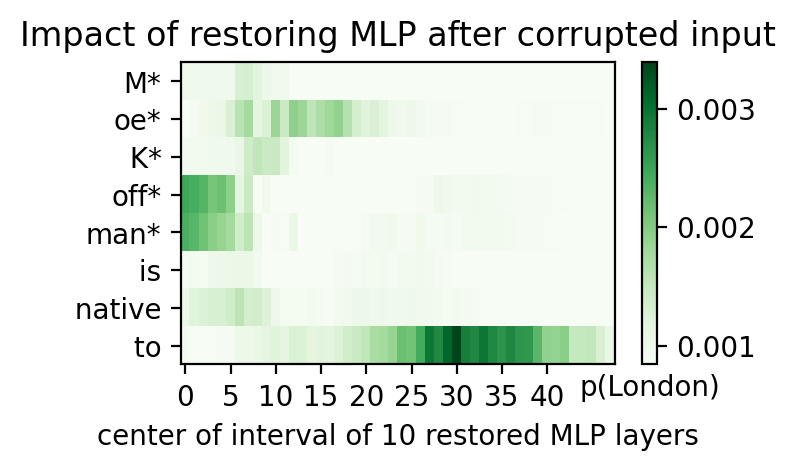

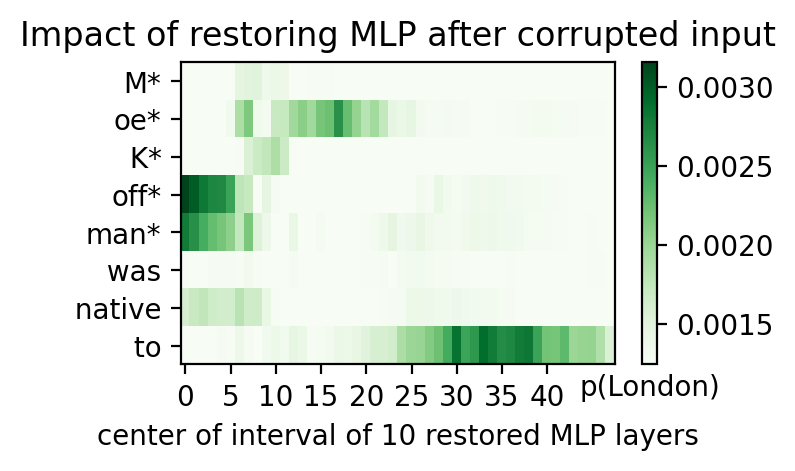

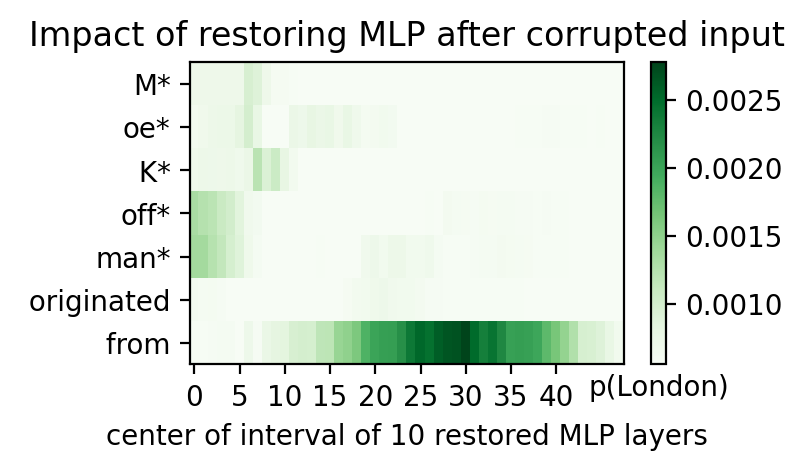

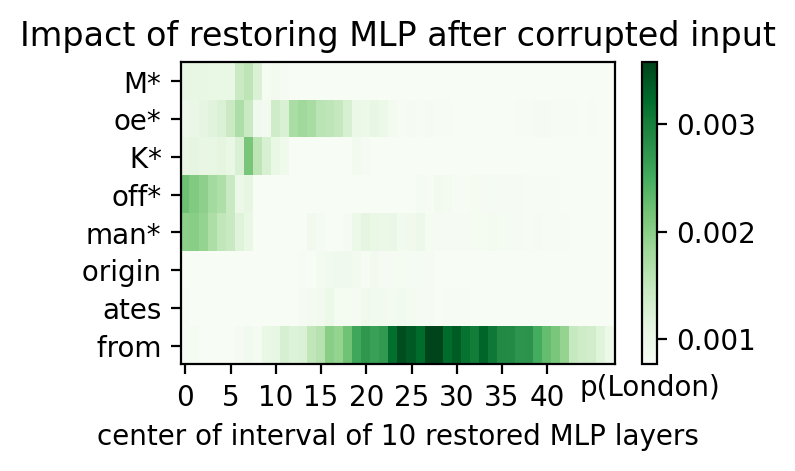

In [6]:
for subject in queries.subject.unique()[:3]:
    sample_ixs = list(queries[queries.subject==subject].index)
    print(f"Plotting results for subject {subject}...")
    for token_ix in range(len(queries.loc[sample_ixs[0]]["top10_tokens"])):
        for sample_ix in sample_ixs:
            results = np.load(os.path.join(results_folder, f"cases/{sample_ix}_any_mlp.npz"), allow_pickle=True)
            differences = results["scores"][:,:,token_ix]
            low_score = results["low_score"][token_ix]
            answer = queries.loc[sample_ix]["top10_tokens"][token_ix]

            kind = str(results["kind"])
            window = results.get("window", 10)
            labels = list(results["input_tokens"])
            for i in range(*results["subject_range"]):
                labels[i] = labels[i] + "*"

            plot_trace_heatmap_from_values(differences, low_score, answer, kind, window, labels,
                                               savepdf=False, title=None, xlabel=None, modelname=None)

### Measure impact pattern similarities between paraphrases for the same output tokens

Also plot normalized TEs. 

Compare similarities in impactfulness distributions to answer:
- What token states are most important to recover (regardless of layer)?
    - Last token, any subject token or other (relation)?
- What layers are most important to recover for each token?
    - 0-48
- Across all layers and tokens
    - Last token, any subject token or other (relation)?

**TODO:**
Compare against null hypothesis values, e.g. other query distributions and uniform distributions.    


In [5]:
def get_tokens_ix_to_trace_for(input_tokens, subject_tokens_ix):
    # keep subject tokens and last token distinct for the analysis
    last_token_ix = len(input_tokens)-1
    assert last_token_ix not in subject_tokens_ix, "This analysis assumes that the last token is not a subject token"
    
    distinct_tokens_ix = set(subject_tokens_ix+[last_token_ix])
    other_tokens_ix = list(set(range(len(input_tokens)))-distinct_tokens_ix)
    return list(distinct_tokens_ix), other_tokens_ix

def get_token_scores(results, token_ix):
    scores = results["scores"][:,:,token_ix]
    subject_tokens_ix = list(range(*results["subject_range"]))
    distinct_tokens_ix, other_tokens_ix = get_tokens_ix_to_trace_for(results["input_tokens"], subject_tokens_ix)

    token_scores = np.concatenate((scores.sum(axis=1)[list(distinct_tokens_ix)], [scores.sum(axis=1)[other_tokens_ix].mean()]))
    token_scores = token_scores/token_scores.sum()
    
    return token_scores

def get_layer_scores(results, token_ix):
    scores = results["scores"][:,:,token_ix]
    subject_tokens_ix = list(range(*results["subject_range"]))
    distinct_tokens_ix, other_tokens_ix = get_tokens_ix_to_trace_for(results["input_tokens"], subject_tokens_ix)
    
    layer_scores = []
    for ix in distinct_tokens_ix:
        layer_scores.append(scores[ix,:])
        layer_scores[-1] = layer_scores[-1]/sum(layer_scores[-1])
    layer_scores.append(scores[other_tokens_ix,:].mean(axis=0)/sum(scores[other_tokens_ix,:].mean(axis=0)))
    layer_scores = np.array(layer_scores)
    
    return layer_scores

def get_token_layer_scores(results, token_ix):
    scores = results["scores"][:,:,token_ix]
    subject_tokens_ix = list(range(*results["subject_range"]))
    distinct_tokens_ix, other_tokens_ix = get_tokens_ix_to_trace_for(results["input_tokens"], subject_tokens_ix)

    token_layer_scores = np.concatenate([scores[distinct_tokens_ix], [scores[other_tokens_ix].mean(axis=0)]])
    #token_layer_scores = np.concatenate([scores[ix,:] for ix in subject_tokens_ix]+[scores[0,:], scores[-1,:], scores[other_tokens_ix,:].mean(axis=0)])
    token_layer_scores = token_layer_scores.flatten()/token_layer_scores.flatten().sum()
    
    return token_layer_scores

def get_sns_formatted_plot_data(scores, distrib_tokens, prompt):
    plot_data = pd.DataFrame(scores, index=distrib_tokens)
    cols = list(plot_data.columns)
    plot_data = plot_data.reset_index()
    plot_data = pd.melt(plot_data, id_vars="index", value_vars=cols)
    plot_data["prompt"] = prompt
    
    return plot_data
        
def get_kl_dict_entry(results, results_to_compare, token_ix, token_ix_to_compare, curr_token, curr_token_to_compare, make_plots):
    dict_entry = {}
    
    # measure KL div for what token state is most important to recover
    # distrib over token pos
    subject_tokens_ix = list(range(*results["subject_range"]))
    distrib_tokens = [f"subject_{i}" for i in subject_tokens_ix]+["last", "other"]
    token_scores = get_token_scores(results, token_ix)

    token_scores_to_compare = get_token_scores(results_to_compare, token_ix_to_compare)
    kl_div = sum(scipy.special.rel_entr(token_scores_to_compare, token_scores))
    dict_entry["token_importance_div"] = kl_div

    if make_plots:
        prompt = (" ").join(results["input_tokens"])+f" ({curr_token})"
        plot_data = get_sns_formatted_plot_data(token_scores, distrib_tokens, prompt)
        
        prompt_compare = (" ").join(results_to_compare["input_tokens"])+f" ({curr_token_to_compare})"
        plot_data_to_compare = get_sns_formatted_plot_data(token_scores_to_compare, distrib_tokens, prompt_compare)
        
        plot_data_tot = pd.concat((plot_data, plot_data_to_compare), ignore_index=True)
        plt.figure(figsize=(15, 5))
        sns.barplot(data=plot_data_tot, x="index", y="value", hue="prompt")
        #plt.bar(x=list(range(len(distrib_tokens))), height=token_scores, tick_label=distrib_tokens)
        #plt.xticks(rotation=50)
        plt.title(f"Token importances (KL div {kl_div:.4f})")
        plt.show()

    # measure KL div for what layer is most important to recover for each token
    layer_scores = get_layer_scores(results, token_ix)
    layer_scores_to_compare = get_layer_scores(results_to_compare, token_ix_to_compare)

    kl_div = {}
    for ix, token in enumerate(distrib_tokens):
        kl_div[token] = sum(scipy.special.rel_entr(layer_scores_to_compare[ix], layer_scores[ix]))
    # store KL divergence values across layers for each token part
    for key, value in kl_div.items():
        dict_entry[f"layer_importance_div_{key}".replace("_0", "_first").replace(str(len(subject_tokens_ix)-1), "last")] = value

    if make_plots:
        prompt = (" ").join(results["input_tokens"])+f" ({curr_token})"
        plot_data = get_sns_formatted_plot_data(layer_scores, distrib_tokens, prompt)

        prompt_compare = (" ").join(results_to_compare["input_tokens"])+f" ({curr_token_to_compare})"
        plot_data_to_compare = get_sns_formatted_plot_data(layer_scores_to_compare, distrib_tokens, prompt_compare)

        plot_data_tot = pd.concat((plot_data, plot_data_to_compare), ignore_index=True)
        for token in distrib_tokens:
            plt.figure(figsize=(15, 5))
            sns.barplot(data=plot_data_tot[plot_data_tot['index']==token], x="variable", y="value", hue="prompt")
            plt.title(f"Layer importances for input token {token}. (KL div {kl_div[token]:.4f})")
            plt.show()

    # measure KL div across all important token positions
    token_layer_scores = get_token_layer_scores(results, token_ix)
    token_layer_scores_to_compare = get_token_layer_scores(results_to_compare, token_ix_to_compare)
    dict_entry["all_token_layers_importance_div"] = sum(scipy.special.rel_entr(token_layer_scores_to_compare, token_layer_scores))

    if make_plots:
        print(f"KL div over flattened token-layer distribution {dict_entry['all_token_layers_importance_div']:.4f}")
    
    return dict_entry

def plot_te_heatmap(results, token_ix, answer):
    te = (results["scores"][:,:,token_ix]-results["low_score"][token_ix])/abs(results["high_score"][token_ix]-results["low_score"][token_ix])
    window = results.get("window", 10)
    kind = str(results["kind"])
    labels = list(results["input_tokens"])
    for i in range(*results["subject_range"]):
        labels[i] = labels[i] + "*"
    bartitle = f"(p**-p*)/(p-p*)"
    plot_normalized_trace_heatmap_from_values(te, -0.5, 1.5, bartitle, kind, window, labels,
                                   savepdf=False, title=f"Impact of restoring MLP for output '{answer.strip()}'", xlabel=None, modelname=None)

In [21]:
make_plots = False

kl_div_data = []
kl_div_data_random = []

max_nbr_causal_trace_samples = 1000
for subject in queries.subject.unique()[:200]: #random.sample(list(queries.subject.unique()[:200]), 3): #queries.subject.unique()[:200]:
    sample_ixs = list(queries[queries.subject==subject].index)
    #print(f"Plotting results for subject {subject}...")
    for token_ix in range(len(queries.loc[sample_ixs[0]]["top10_tokens"])):
        results_lama = np.load(os.path.join(results_folder, f"cases/{sample_ixs[0]}_any_mlp.npz"), allow_pickle=True)
        for sample_ix in sample_ixs:
            results = np.load(os.path.join(results_folder, f"cases/{sample_ix}_any_mlp.npz"), allow_pickle=True)
            answer = queries.loc[sample_ix]["top10_tokens"][token_ix]
            dict_data = {"sample_ix": sample_ix, 
                         "subject": subject, 
                         "top10_token": answer.strip(),
                         "is_lama_prompt": sample_ix==sample_ixs[0],
                         "is_random_comparison": False,
                         "te": results["high_score"][token_ix]-results["low_score"][token_ix]}

            if make_plots:
                plot_te_heatmap(results, token_ix, answer)
            
            dict_data.update(get_kl_dict_entry(results, results_lama, token_ix, token_ix, answer.strip(), answer.strip(), make_plots))
            
            # get baseline results for another random query (not LAMA prompt correspondence)
            #subject_random = random.sample(list(queries.iloc[:max_nbr_causal_trace_samples].subject.unique()), 1)[0]
            #sample_ix_random = random.sample(list(queries[queries.subject==subject_random].index), 1)[0]
            #top10_token_random = random.sample(queries.loc[sample_ix_random]["top10_tokens"], 1)[0]
            subject_random = subject
            sample_ix_random = sample_ix
            results_random = np.load(os.path.join(results_folder, f"cases/{sample_ix_random}_any_mlp.npz"), allow_pickle=True)
            
            top10_tokens_for_sampling = queries.loc[sample_ix_random]["top10_tokens"].copy()
            top10_tokens_for_sampling.remove(answer)
            top10_token_random = random.sample(top10_tokens_for_sampling, 1)[0]
            top10_token_ix_random = queries.loc[sample_ix_random]["top10_tokens"].index(top10_token_random)
            dict_data_random = {"sample_ix": sample_ix_random,
                                "subject": subject_random,
                                "top10_token": top10_token_random.strip(),
                                "is_lama_prompt": sample_ix==sample_ixs[0],
                                "is_random_comparison": True,
                                "te": results_random["high_score"][top10_token_ix_random]-results_random["low_score"][top10_token_ix_random]
                               }
            if make_plots:
                plot_te_heatmap(results_random, top10_token_ix_random, top10_token_random)
            
            dict_data_random.update(get_kl_dict_entry(results, results_random, token_ix, top10_token_ix_random, answer.strip(), top10_token_random.strip(), make_plots))
            
            #dict_data.update(dict_data_random)
            kl_div_data.append(dict_data)
            kl_div_data_random.append(dict_data_random)
            
kl_div_data_random = pd.DataFrame(kl_div_data_random)
kl_div_data = pd.DataFrame(kl_div_data)
kl_div_data.head()

,sample_ix,subject,top10_token,is_lama_prompt,is_random_comparison,te,token_importance_div,layer_importance_div_subject_first,layer_importance_div_subject_1,layer_importance_div_subject_2,...,all_token_layers_importance_div,layer_importance_div_subject_3,layer_importance_div_subject_4,layer_importance_div_subject_5,layer_importance_div_subject_6,layer_importance_div_subject_7,layer_importance_div_subject_8,layer_importance_div_subject_9,layer_importance_div_subject_10,layer_importance_div_subject_11
0,0,Allan Peiper,New,True,False,0.023766,0.000000,0.000000,0.000000,0.000000,...,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Allan Peiper,New,False,False,0.021967,0.000129,0.000799,0.001877,0.000271,...,0.006033,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Allan Peiper,New,False,False,0.018423,0.000151,0.000801,0.001771,0.000632,...,0.006399,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Allan Peiper,New,False,False,0.022872,0.000783,0.002591,0.002536,0.002665,...,0.017647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Allan Peiper,New,False,False,0.016975,0.001102,0.003925,0.003490,0.001508,...,0.014291,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
len(kl_div_data)

14000

In [45]:
kl_div_data = kl_div_data.reindex(sorted(kl_div_data.columns), axis=1)
kl_div_data[kl_div_data.is_lama_prompt==False].agg(['mean', 'std', 'max', 'min'])

,all_token_layers_importance_div,is_lama_prompt,is_random_comparison,layer_importance_div_first,layer_importance_div_last,layer_importance_div_other,layer_importance_div_subject_1,layer_importance_div_subject_2,layer_importance_div_subject_3,layer_importance_div_subject_4,layer_importance_div_subject_5,layer_importance_div_subject_6,layer_importance_div_subject_first,layer_importance_div_subject_last,sample_ix,subject,token_importance_div,top10_token
mean,0.029846,0.0,0.0,0.014645,0.035031,0.003126,0.019815,0.015012,0.013037,0.010098,0.010273,0.011039,0.014645,0.026370,3500.000000,NaN,0.010461,NaN
std,0.040274,0.0,0.0,0.027969,0.036842,0.004683,0.032667,0.026625,0.024171,0.014096,0.017104,0.013117,0.027969,0.044736,2020.894068,NaN,0.018234,NaN
max,0.558747,False,False,0.490892,0.321950,0.065137,0.488105,0.501006,0.335083,0.159002,0.172844,0.077607,0.490892,0.615115,6999.000000,Yvonne Blake,0.240732,the
min,0.000536,False,False,0.000011,0.000432,0.000036,0.000069,0.000126,0.000088,0.000100,0.000097,0.000714,0.000011,0.000102,1.000000,Aaron King,0.000005,14


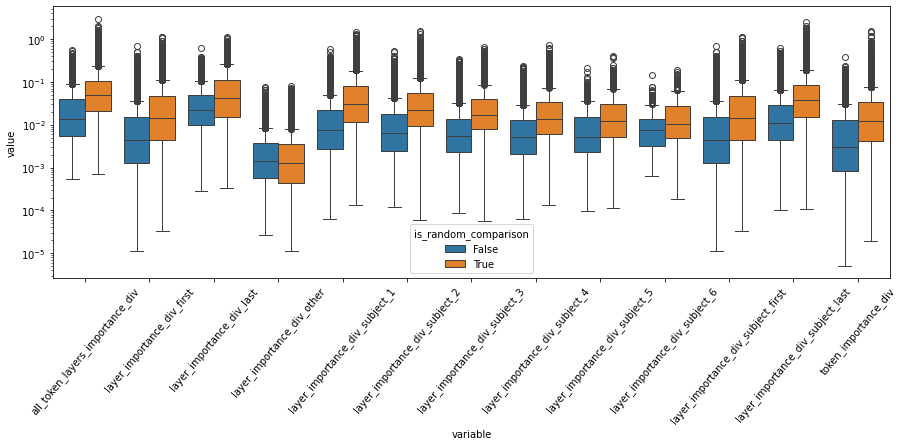

In [14]:
kl_div_data["sample_ix"] = kl_div_data.index
kl_div_data_random["sample_ix"] = kl_div_data_random.index

plot_data = pd.concat([kl_div_data, kl_div_data_random], ignore_index=True)
#cols = list(set(plot_data.columns)-{"is_lama_prompt"}-{"is_random_comparison"}-{"sample_ix"})
cols = ['all_token_layers_importance_div',
         'layer_importance_div_first',
         'layer_importance_div_last',
         'layer_importance_div_other',
         'layer_importance_div_subject_1',
         'layer_importance_div_subject_2',
         'layer_importance_div_subject_3',
         'layer_importance_div_subject_4',
         'layer_importance_div_subject_5',
         'layer_importance_div_subject_6',
         'layer_importance_div_subject_first',
         'layer_importance_div_subject_last',
         'token_importance_div']
plot_data = plot_data.reset_index()
plot_data = pd.melt(plot_data, id_vars=["index", "sample_ix", "is_lama_prompt", "is_random_comparison"], value_vars=cols)
plot_data

plt.figure(figsize=(15, 5))
sns.boxplot(data=plot_data[plot_data.is_lama_prompt==False], x="variable", y="value", hue="is_random_comparison")
plt.xticks(rotation=50)
plt.yscale('log')
plt.show()

Divergences are generally smaller for same token tracing across paraphrases. But not by much? Investigate cases with high divergences for same token and see if there is a pattern. Add results to presentation!

Divergence values measured are very small.
- Check max
- Add random comparison to other queries (of same subject length!)
- Is the code correct? Double check.

### Examine differences between cases for which P-P* is positive or negative

In [23]:
kl_div_data.corr()["te"]

sample_ix                            -0.007295
is_lama_prompt                        0.048060
is_random_comparison                       NaN
te                                    1.000000
token_importance_div                  0.144219
layer_importance_div_subject_first    0.082155
layer_importance_div_subject_1        0.092740
layer_importance_div_subject_2        0.097171
layer_importance_div_subject_last     0.105544
layer_importance_div_last             0.128977
layer_importance_div_other            0.104772
all_token_layers_importance_div       0.144161
layer_importance_div_subject_3        0.074574
layer_importance_div_subject_4        0.062720
layer_importance_div_subject_5        0.047193
layer_importance_div_subject_6        0.081936
layer_importance_div_subject_7        0.041693
layer_importance_div_subject_8        0.019491
layer_importance_div_subject_9        0.106967
layer_importance_div_subject_10       0.225441
layer_importance_div_subject_11       0.261906
Name: te, dty

In [24]:
kl_div_data_random.corr()["te"]

sample_ix                             0.004389
is_lama_prompt                        0.047350
is_random_comparison                       NaN
te                                    1.000000
token_importance_div                 -0.002820
layer_importance_div_subject_first   -0.087535
layer_importance_div_subject_1       -0.107200
layer_importance_div_subject_2       -0.052737
layer_importance_div_subject_last    -0.062449
layer_importance_div_last            -0.168016
layer_importance_div_other           -0.096508
all_token_layers_importance_div      -0.014478
layer_importance_div_subject_3       -0.058150
layer_importance_div_subject_4       -0.072958
layer_importance_div_subject_5       -0.045530
layer_importance_div_subject_6       -0.059766
layer_importance_div_subject_7       -0.052707
layer_importance_div_subject_8       -0.019711
layer_importance_div_subject_9       -0.094162
layer_importance_div_subject_10      -0.295923
layer_importance_div_subject_11      -0.203429
Name: te, dty

Filter out cases for which the TE is negative

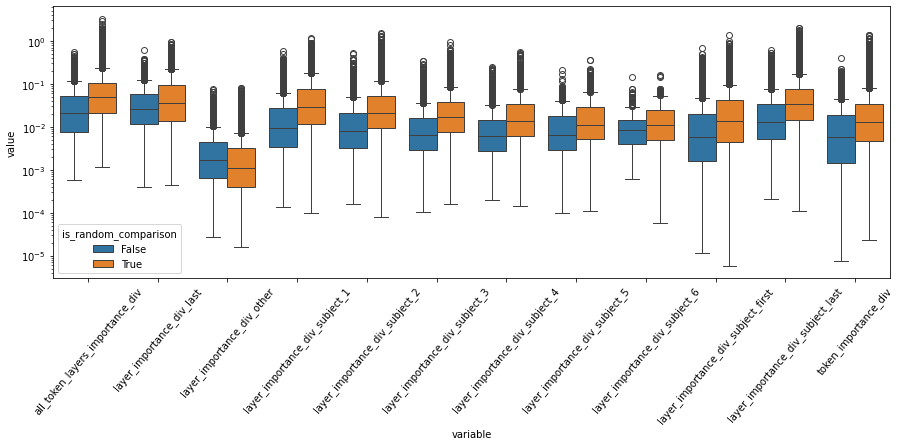

In [26]:
kl_div_data["sample_ix"] = kl_div_data.index
kl_div_data_random["sample_ix"] = kl_div_data_random.index

plot_data = pd.concat([kl_div_data, kl_div_data_random], ignore_index=True)
#cols = list(set(plot_data.columns)-{"is_lama_prompt"}-{"is_random_comparison"}-{"sample_ix"})
cols = ['all_token_layers_importance_div',
         'layer_importance_div_last',
         'layer_importance_div_other',
         'layer_importance_div_subject_1',
         'layer_importance_div_subject_2',
         'layer_importance_div_subject_3',
         'layer_importance_div_subject_4',
         'layer_importance_div_subject_5',
         'layer_importance_div_subject_6',
         'layer_importance_div_subject_first',
         'layer_importance_div_subject_last',
         'token_importance_div']
plot_data = plot_data.reset_index()
plot_data = pd.melt(plot_data, id_vars=["index", "sample_ix", "is_lama_prompt", "is_random_comparison", "te"], value_vars=cols)
plot_data

plt.figure(figsize=(15, 5))
sns.boxplot(data=plot_data[(plot_data.is_lama_prompt==False) & (plot_data.te>0)], x="variable", y="value", hue="is_random_comparison")
plt.xticks(rotation=50)
plt.yscale('log')
plt.show()

### Error case analysis: negative P-P* for _Maximilian Sforza_

In [20]:
queries[queries.subject=="Maximilian Sforza"]

,attribute,candidate_p,candidate_prediction,candidate_rank,gold_p,gold_rank,known_id,prediction,prediction_p,prompt,relation_id,subject,template,top10_tokens,top10_tokens_probs
266,Milan,0.047170,Milan,1.0,0.047170,1.0,266.0,the,0.081638,Maximilian Sforza was born in,P19,Maximilian Sforza,{} was born in,"[ the, Milan, 17, Rome, 16, 15, Florence...","[0.08163771033287048, 0.04717012867331505, 0.0..."
267,Milan,0.077401,Italy,1.0,0.023844,5.0,267.0,the,0.109176,Maximilian Sforza is originally from,P19,Maximilian Sforza,{} is originally from,"[ the, Milan, 17, Rome, 16, 15, Florence...","[0.10917647182941437, 0.023844469338655472, 4...."
268,Milan,0.049949,Italy,1.0,0.037021,2.0,268.0,the,0.138073,Maximilian Sforza was originally from,P19,Maximilian Sforza,{} was originally from,"[ the, Milan, 17, Rome, 16, 15, Florence...","[0.13807328045368195, 0.03702089190483093, 0.0..."
269,Milan,0.073205,Italy,1.0,0.024576,4.0,269.0,the,0.145229,Maximilian Sforza is native to,P19,Maximilian Sforza,{} is native to,"[ the, Milan, 17, Rome, 16, 15, Florence...","[0.1452290564775467, 0.024575592949986458, 5.9..."
270,Milan,0.044212,Italy,1.0,0.042912,2.0,270.0,the,0.185893,Maximilian Sforza was native to,P19,Maximilian Sforza,{} was native to,"[ the, Milan, 17, Rome, 16, 15, Florence...","[0.18589341640472412, 0.042911529541015625, 0...."
271,Milan,0.054798,Italy,2.0,0.034626,3.0,271.0,the,0.218712,Maximilian Sforza originated from,P19,Maximilian Sforza,{} originated from,"[ the, Milan, 17, Rome, 16, 15, Florence...","[0.21871156990528107, 0.034626491367816925, 0...."
272,Milan,0.045003,Italy,2.0,0.028036,3.0,272.0,the,0.227386,Maximilian Sforza originates from,P19,Maximilian Sforza,{} originates from,"[ the, Milan, 17, Rome, 16, 15, Florence...","[0.22738637030124664, 0.02803611196577549, 0.0..."


Normalized plot

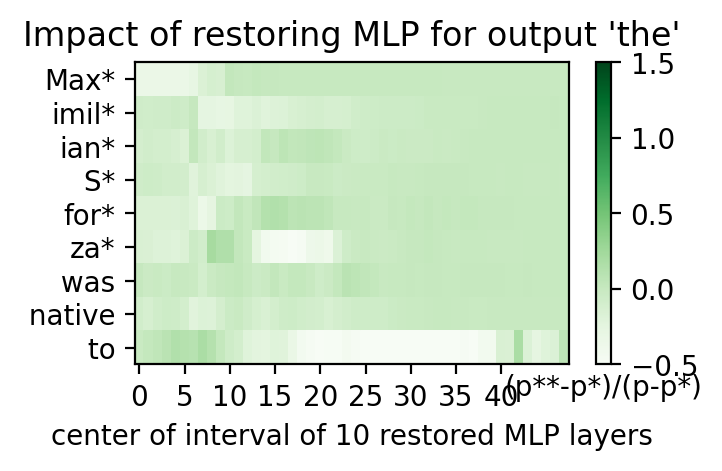

In [33]:
sample_ix = 270
results = np.load(os.path.join(results_folder, f"cases/{sample_ix}_any_mlp.npz"), allow_pickle=True)
token_ix = 0
answer = queries.loc[sample_ix]["top10_tokens"][token_ix]
plot_te_heatmap(results, token_ix, answer)

Standard RoME plot (not normalized)

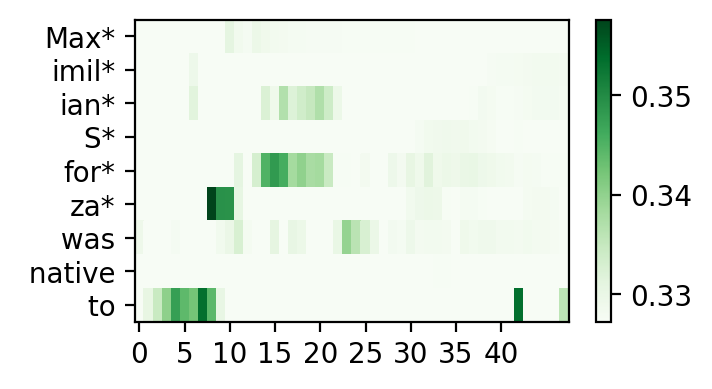

In [18]:
window = results.get("window", 10)
kind = str(results["kind"])
labels = list(results["input_tokens"])
for i in range(*results["subject_range"]):
    labels[i] = labels[i] + "*"
bartitle = f""
low_score = results["low_score"][token_ix]
plot_trace_heatmap_from_values(results["scores"][:,:,token_ix], low_score, answer, kind, window, labels, False, "", "", "")

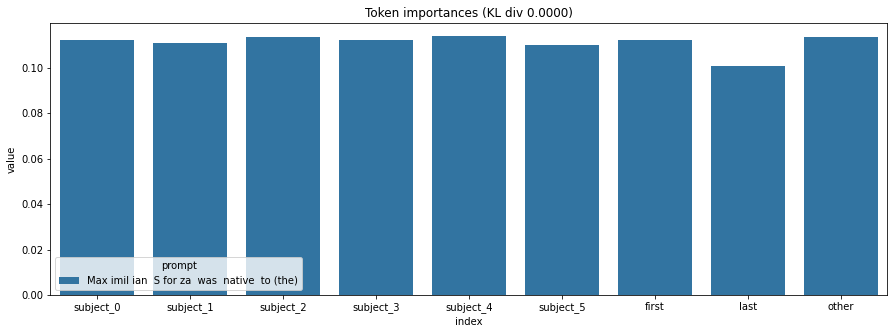

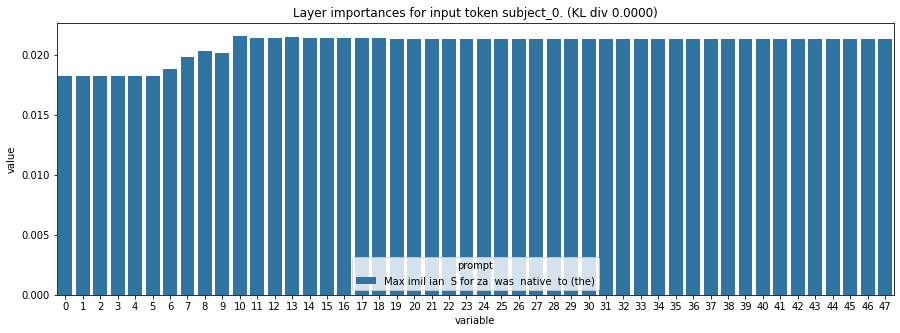

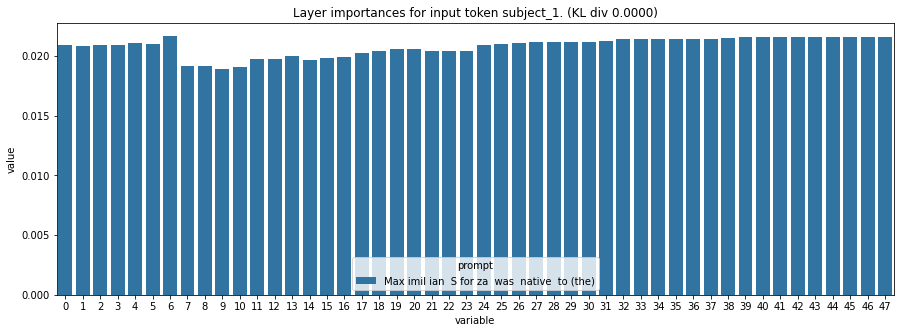

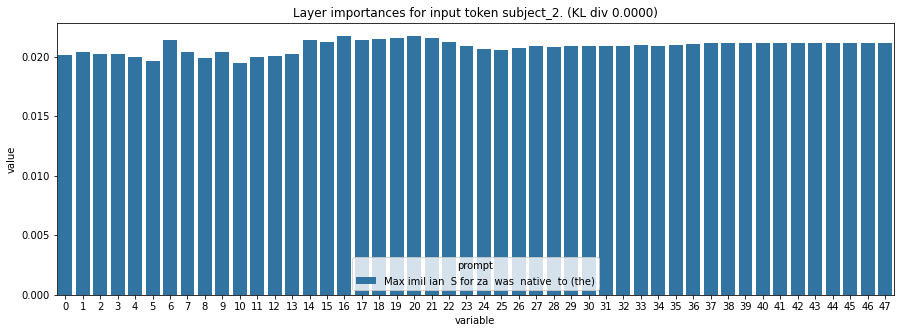

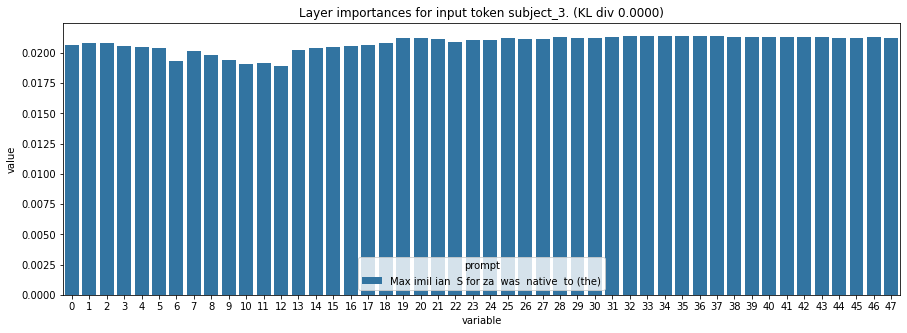

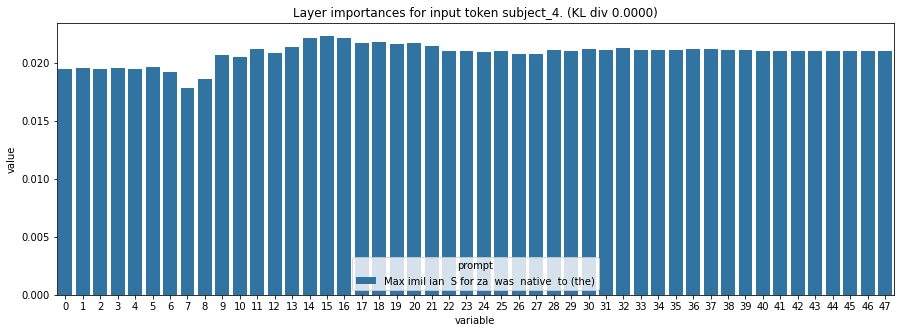

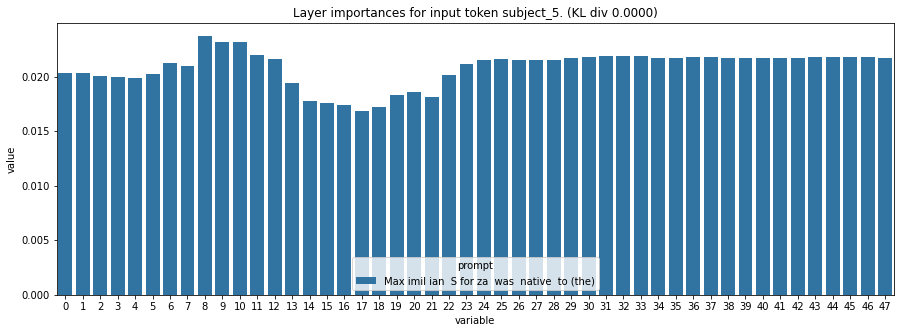

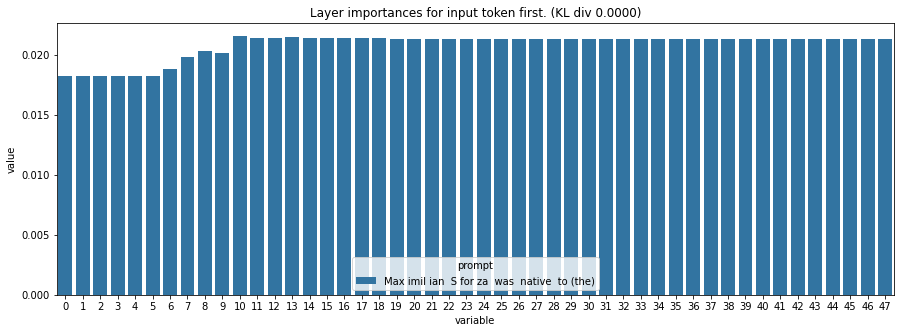

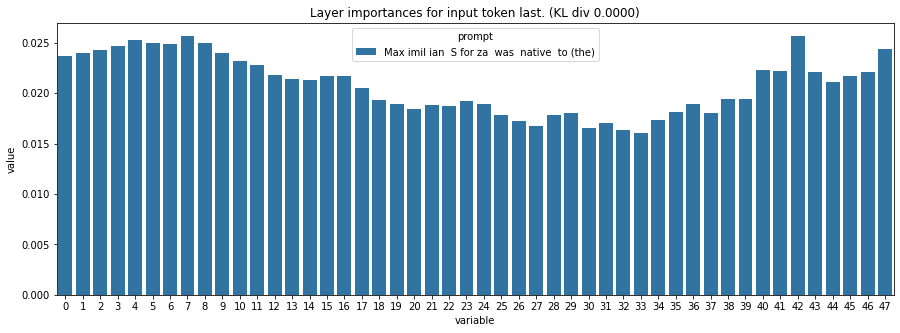

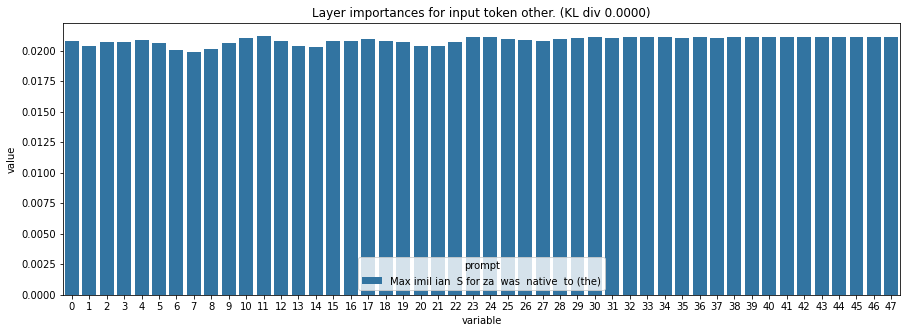

KL div over flattened token-layer distribution 0.0000


{'token_importance_div': 0.0,
 'layer_importance_div_subject_first': 0.0,
 'layer_importance_div_subject_1': 0.0,
 'layer_importance_div_subject_2': 0.0,
 'layer_importance_div_subject_3': 0.0,
 'layer_importance_div_subject_4': 0.0,
 'layer_importance_div_subject_last': 0.0,
 'layer_importance_div_first': 0.0,
 'layer_importance_div_last': 0.0,
 'layer_importance_div_other': 0.0,
 'all_token_layers_importance_div': 0.0}

In [8]:
get_kl_dict_entry(results, results, token_ix, token_ix, answer.strip(), answer.strip(), True)

### Investigation into negative TE

For some results the perturbed subject token yields a higher probability for the traced token compared to for the unperturbed subbject (e.g. for the case of "the"). For these cases the CT approach rather measures where it is less bad to restore the state, rather than where it is important to restore the state, probably not measuring what we are interested in.

Filter out cases for which low_score is higher than high_score?

In [14]:
score_diff_samples = []
for subject in queries.subject.unique()[:200]:
    sample_ixs = list(queries[queries.subject==subject].index)
    #print(f"Plotting results for subject {subject}...")
    for sample_ix in sample_ixs:
        for token_ix in range(len(queries.loc[sample_ixs[0]]["top10_tokens"])):
            results = np.load(os.path.join(results_folder, f"cases/{sample_ix}_any_mlp.npz"), allow_pickle=True)
            score_diff_samples.append({"subject": subject, 
                                "sample_ix": sample_ix,
                                "template": queries.loc[sample_ix]["template"],
                                "prompt": results["input_tokens"].tolist(), 
                                "token": queries.loc[sample_ix]["top10_tokens"][token_ix], 
                                "score_diff": results["high_score"][token_ix]-results["low_score"][token_ix]})

score_diff_data = pd.DataFrame(score_diff_samples)       
score_diff_data.head()

,subject,sample_ix,template,prompt,token,score_diff
0,Allan Peiper,0,{} was born in,"[All, an, Pe, iper, was, born, in]",New,0.023766
1,Allan Peiper,0,{} was born in,"[All, an, Pe, iper, was, born, in]",the,-0.090881
2,Allan Peiper,0,{} was born in,"[All, an, Pe, iper, was, born, in]",London,0.017587
3,Allan Peiper,0,{} was born in,"[All, an, Pe, iper, was, born, in]",18,0.001129
4,Allan Peiper,0,{} was born in,"[All, an, Pe, iper, was, born, in]",Toronto,0.011949


In [15]:
score_diff_data.sort_values("score_diff")

,subject,sample_ix,template,prompt,token,score_diff
12240,Abd al-Qadir al-Husayni,1224,{} originates from,"[Ab, d, al, -, Q, ad, ir, al, -, H, us, ay, ...",the,-0.277869
12632,Atul Chitnis,1263,{} is native to,"[At, ul, Ch, it, nis, is, native, to]",the,-0.252845
41,Allan Peiper,4,{} was native to,"[All, an, Pe, iper, was, native, to]",the,-0.250188
12642,Atul Chitnis,1264,{} was native to,"[At, ul, Ch, it, nis, was, native, to]",the,-0.249438
6132,Amol Palekar,613,{} was native to,"[Am, ol, Pal, ek, ar, was, native, to]",the,-0.248875
...,...,...,...,...,...,...
12320,"Elizabeth Boleyn, Countess of Wiltshire",1232,{} was born in,"[Elizabeth, Bo, ley, n, ,, Count, ess, of, ...",15,0.260289
11502,Sergey Lavrov,1150,{} was originally from,"[Ser, gey, Lavrov, was, originally, from]",St,0.290817
11492,Sergey Lavrov,1149,{} is originally from,"[Ser, gey, Lavrov, is, originally, from]",St,0.301895
2810,Parviz Davoodi,281,{} is originally from,"[Par, v, iz, Dav, ood, i, is, originally, ...",Iran,0.311235


<AxesSubplot:>

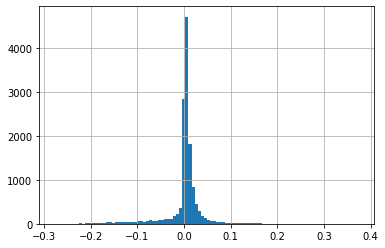

In [11]:
score_diff_data.score_diff.hist(bins=100)

In [8]:
score_diff_data[score_diff_data.score_diff<0].subject.value_counts()

Charles Holmes          40
Edward Henry            37
Sirindhorn              33
Pennie Smith            30
Joseph McMoneagle       30
                        ..
Giulio Romano            7
Ludwig Marcuse           7
Daniele Franceschini     7
Roddy McMillan           7
Carsten Dahl             6
Name: subject, Length: 200, dtype: int64

The negative treatment effects are observed more often for certain templates.

In [53]:
score_diff_data[score_diff_data.score_diff<0].template.value_counts()

{} is originally from     554
{} was originally from    523
{} is native to           482
{} was born in            438
{} originates from        434
{} was native to          418
{} originated from        394
Name: template, dtype: int64

For 23% of the samples for the 200 subjects examined (14000 samples in total incl. top 10 tokens and paraphrases), perturbing the subject yields an improved probability of the traced token. 3243 erronous cases in total, for which the tokens "the", "a" and "18" make out 2707 of those samples. Also, the "the" and "a" samples generally do not work that well (a positive TE is only noted for 44 and 71 occurrences respectively).

In [45]:
score_diff_data[score_diff_data.score_diff<0].token.value_counts()

 the          1356
 a             818
 18            533
 London        121
 17            114
 England        56
 New            42
 South          39
 16             22
 K              18
 Chicago        11
 Paris          11
 Germany         8
 15              8
 9               6
 India           6
 France          6
 B               5
 14              5
 Los             5
 Berlin          5
 Rome            4
 1988            4
 St              4
 6               4
 Boston          3
 7               3
 Texas           3
 Sweden          2
 1987            2
 150             2
 Norway          2
 1954            2
 San             2
 Denmark         2
 8               2
 North           2
 Japan           1
 Italy           1
 L               1
 Stockholm       1
 Prague          1
Name: token, dtype: int64

In [57]:
score_diff_data[score_diff_data.score_diff>0].token.value_counts()[" the"]

44

In [58]:
score_diff_data[score_diff_data.score_diff>0].token.value_counts()[" a"]

71

In [39]:
len(score_diff_data[score_diff_data.score_diff<0])

3243

In [40]:
len(score_diff_data)

14000